# Counter Analysis

In [1]:
import sys
import os

# Get the current working directory (where the notebook is located)
curr_dir = os.getcwd()

# Add the project root to the system path
project_root = os.path.abspath(os.path.join(curr_dir, '..'))
sys.path.append(project_root)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=DeprecationWarning)

import pandas as pd

from tueplots import bundles
import matplotlib.pyplot as plt
import src.BikeDataPlotter as BikePlotter
import src.EventsDataPlotter as EventsPlotter
import src.Colortheme as ct

from src.LoadEventsData import EventsData
from src.LoadEcoCounterData import EcoCounterData as BikeData

## Data Handling and Visualization Setup

Our main dataset is sourced from [daten-bw](https://www.daten-bw.de/web/guest/suchen/-/details/gebundelte-eco-counter-fahrradzahldaten-baden-wurttemberg), consisting of Eco Counter data.
The purpose of this evaluation is to gain an insight into the counting data of the bicycle counters in Tübingen.

In [2]:
bd = BikeData()
ed = EventsData()
# Rolling window of 7 days
rolling_window = 7
# Corrected removes days for one counter with zählstand sum zero
daily_bike_data = [
    bd.get_daily_data(None, None, corrected=True, time_as_index=True),
    bd.get_daily_data(None, None, corrected=False, time_as_index=True) 
]
# Overview of what the bike data contains
daily_bike_data[0].head()

,counter_site,counter_site_id,calendar_week,weekday,zählstand
iso_timestamp,,,,,
2014-01-01,Fuß- & Radtunnel Südportal - Derendinger Allee,100003358,1,2,663
2014-01-01,Unterführung Steinlach/Karlstraße Südseite - S...,100003359,1,2,942
2014-01-02,Fuß- & Radtunnel Südportal - Derendinger Allee,100003358,1,3,1170
2014-01-02,Unterführung Steinlach/Karlstraße Südseite - S...,100003359,1,3,2205
2014-01-03,Fuß- & Radtunnel Südportal - Derendinger Allee,100003358,1,4,1531


The Tübingen bicycle counters include:

- 100003358: Fahrradtunnel
- 100003359: Unterführung Steinlachallee
- 100026408: Radweg Hirschau abbreviated

The first two counters are situated in the city center.
The Hirschau counter is located on a cycle path approximately 4 km outside the city and was installed in 2016.

To gain a better understanding of the data, we look at the daily counted bikes for each counter.\
For each counter, yearly and total metrics (maximum, mean and total count) are calculated.

In [3]:
counter_ids = [100003358, 100003359, 100026408]
labels = ["Fahrradtunnel", "Unterführung Steinlachallee", "Radweg Hirschau"]
columns = ["counter", "year", "max", "mean", "sum"]
df = pd.DataFrame(columns=columns)

for i, id in enumerate(counter_ids):
    counter = bd.get_daily_data(counter_id=[id], time_as_index=True)
    for year in counter.index.year.unique():
        year_dict = {}
        year_dict["counter"] = labels[i]
        year_dict["year"] = year
        year_dict["max"] = counter[counter.index.year == year]["zählstand"].max()
        year_dict["mean"] = counter[counter.index.year == year]["zählstand"].mean()
        year_dict["sum"] = counter[counter.index.year == year]["zählstand"].sum()
        tmp_df = pd.DataFrame([year_dict])
        df = pd.concat([df, tmp_df], ignore_index=True)
        
    total_dict = {}
    total_dict["counter"] = labels[i]
    total_dict["year"] = "total"
    total_dict["max"] = counter["zählstand"].max()
    total_dict["mean"] = counter["zählstand"].mean()
    total_dict["sum"] = counter["zählstand"].sum()
    tmp_df = pd.DataFrame([total_dict])
    df = pd.concat([df, tmp_df], ignore_index=True)
df

,counter,year,max,mean,sum
0,Fahrradtunnel,2014,7265,3594.087671,1311842
1,Fahrradtunnel,2015,7711,3746.463014,1367459
2,Fahrradtunnel,2016,7301,3442.079235,1259801
3,Fahrradtunnel,2017,7246,3490.561644,1274055
4,Fahrradtunnel,2018,7593,3818.418283,1378449
5,Fahrradtunnel,2019,7754,3753.005602,1339823
6,Fahrradtunnel,2020,7620,3753.190883,1317370
7,Fahrradtunnel,2021,7646,3669.246575,1339275
8,Fahrradtunnel,2022,7936,4139.449315,1510899
9,Fahrradtunnel,2023,7744,4314.384615,1290001


The presented table indicates a consistent increase in maximum daily counts for Fahrradtunnel, reaching its peak in 2022 at 7936.\
Mean daily counts show fluctuations but generally trend upwards, contributing to a total count of 13,388,974 for all years combined.

The year 2018 emerges as a peak for both Fahrradtunnel and Unterführung Steinlachallee, particularly in terms of mean daily counts.\
Unterführung Steinlachallee consistently maintains higher total counts compared to Fahrradtunnel and Radweg Hirschau.

Examining the influences of specific events such as holidays, a more detailed analysis will be conducted for each counter, focusing on individual years.

In [4]:
# This will be used to visualize upcoming evaluation of the bike counters.
plt.rcParams['legend.facecolor'] = 'white'
plt.rcParams['legend.framealpha'] = .8
plt.rcParams.update({"figure.dpi": 200})
def set_legend(axes, legend_types):
    if len(legend_types)==1:
        order = [BikePlotter.LEGEND_COUNTER_ORDER[legend_types[0]]]*len(axes)
    else:
        order = [
            BikePlotter.LEGEND_COUNTER_ORDER[lt]
            for lt in legend_types
        ]
    for i,ax in enumerate(axes):
        handles, labels = ax.get_legend_handles_labels()
        new_labels_order = [labels[idx] for idx in order[i]]
        # new_labels_order.insert(0,custom_legend[1])
        new_handles_order = [handles[idx] for idx in order[i]]
        # new_handles_order.insert(0,custom_legend[0])
        leg = ax.legend(new_handles_order, new_labels_order, loc="upper left", ncol=1, borderaxespad=0.3)
        # plt.legend(bbox_to_anchor=(0, 1.02, 1, 0.2), loc="lower left",
        #         mode="expand", borderaxespad=0, ncol=3)
def filter_by_year(df, year, counter=None):
    filtered = df[df.index.year == year]
    if counter is not None:
        filtered = filtered[filtered["counter_site_id"]==counter]
    return filtered
def create_daily_per_counter_plot(stylesheet, year, daily_bike_data,
                                  get_figure=False, legend_select=["standard"],
                                  show_covid=False):
    plt.rcParams.update(stylesheet)
    bike_data = [
        filter_by_year(daily_bike_data[0],year),
        filter_by_year(daily_bike_data[1],year)
    ]
    avb_counter = bike_data[0]["counter_site_id"].unique().tolist()
    fig_info = plt.subplots(len(avb_counter), 1, sharex=False)
    BikePlotter.plot_daily_per_counter(bike_data, avb_counter, year, fig_info, rolling_window)
    holidays = EventsPlotter.plot_holidays(ed, [year], fig_info[1])
    EventsPlotter.plot_school_breaks(ed, [year], fig_info[1])
    EventsPlotter.plot_lecture_period(ed, [year], fig_info[1])
    if show_covid:
        covid_info = EventsPlotter.plot_covid(ed, [year], fig_info[1])
    set_legend(fig_info[1], legend_select)
    if get_figure:
        return fig_info
    else:
        plt.show()
        EventsPlotter.print_holiday_info(holidays)
        EventsPlotter.print_coivd_info(covid_info) if show_covid else None

## 2014

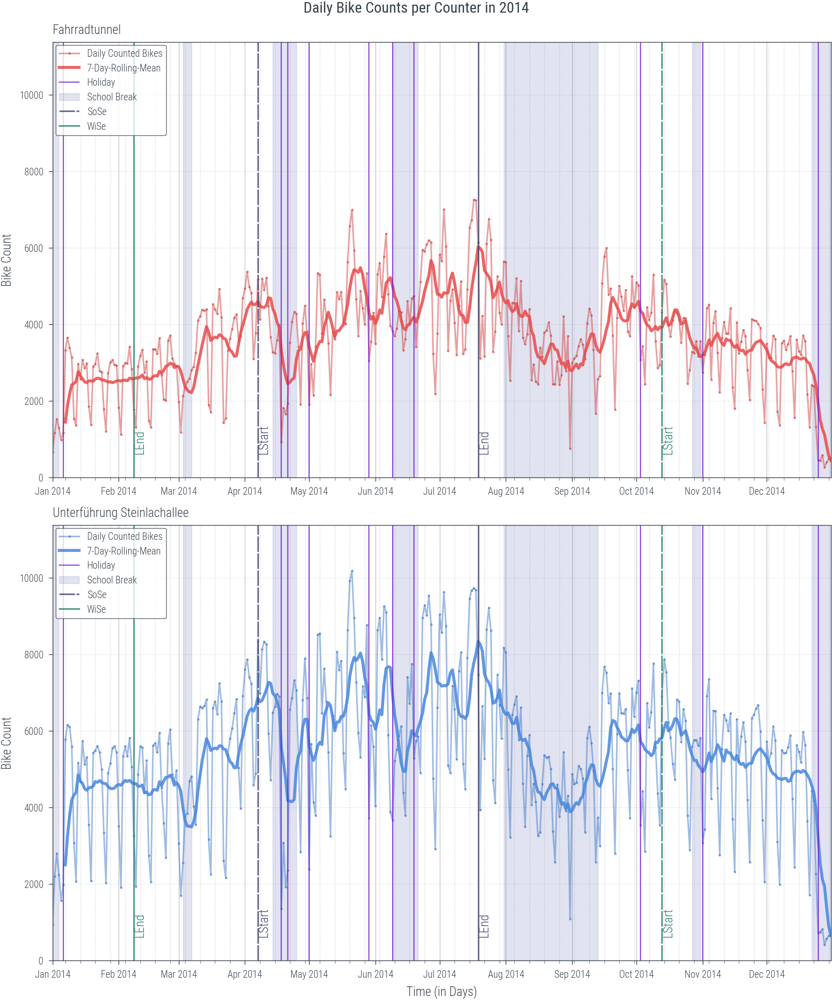

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Allerheiligen, Weihnachten



In [5]:
STYLE_2_COUNTERS = bundles.beamer_moml(rel_width=2, rel_height=3.2)
create_daily_per_counter_plot(STYLE_2_COUNTERS, 2014, daily_bike_data)

### 2014: Observations
- both counters show a similar pattern
- the bike count appears to be higher in the summer months 
- starting from April to October the deviation of counts within seven days is larger than in the winter months.\
  This might be due to the fact that more people are cycling to work or school during the summer months, but the amount of people cycling on weekends doesn't seem to change as much as during the winter months
- a weekly pattern might be assumed from the four to five regularly spaced lowest points in a month (each seventh day)
- holidays (vertical lines) and school breaks (gray areas) appear to have a strong influence, as the count is lower during these periods or days

School breaks are (ordered by time of year):
- winter break (first and last gray area in the plot)
- carnival ("Fasnacht") break
- easter break
- whitsun ("Pfingsten") break
- summer break
- autumn break

__Further Observations__:
- from January, after the winter break, to March the count pattern is very regular
- during the carnival break the weekend dip is not as strong as usual, a clear increase of counts can be observed
- May the 1st is a holiday, the count is lower than usual
- August the 31st has a very low count, no information about this day could be found (disclaimer: the weather wasn't bad on this day)

## 2015

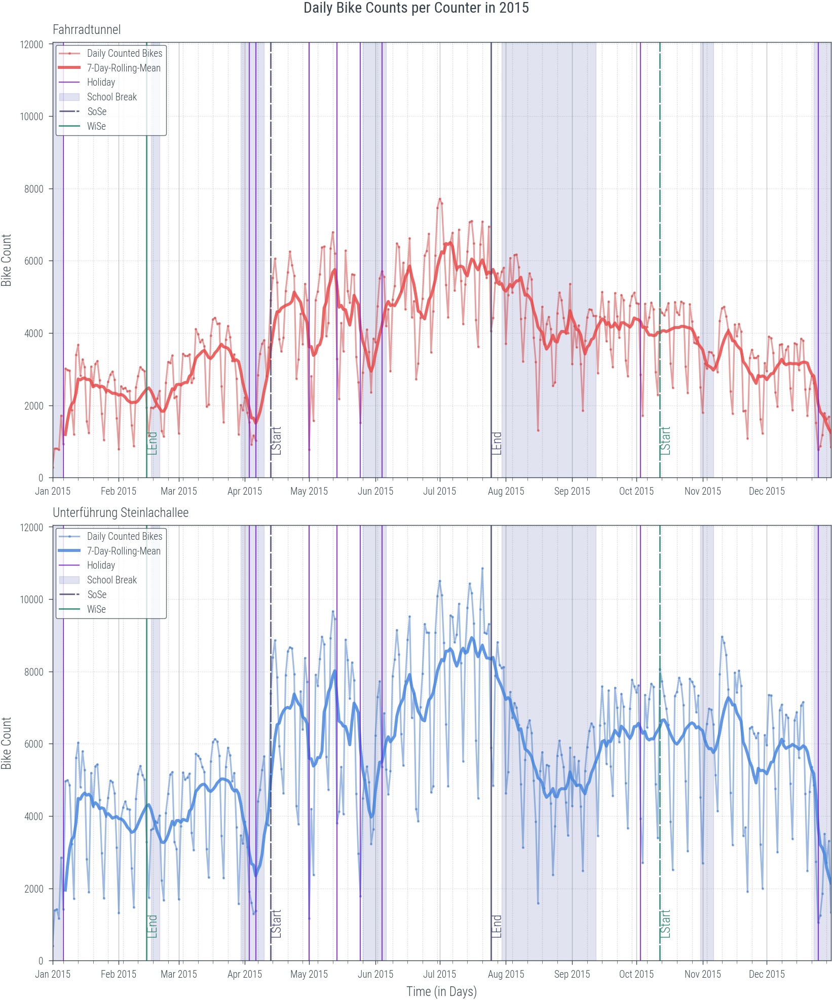

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Weihnachten



In [6]:
create_daily_per_counter_plot(STYLE_2_COUNTERS, 2015, daily_bike_data)

### 2015: Observations
- the pattern is similar to 2014
- the count is higher in the summer months compared to winter months, as in 2014
- the deviation of counts within seven days is larger in the summer months than in the winter months, as in 2014
- the regular pattern from January to March is interrupted by the carnival break
- in the first week of the easter break the count is lower than in 2014. It might have been some _rainy days_ or more working people decided to go on vacation during this time
- in the data of Fahrradtunnel the autumn break is better visible than in the Steinlachallee data

## 2016

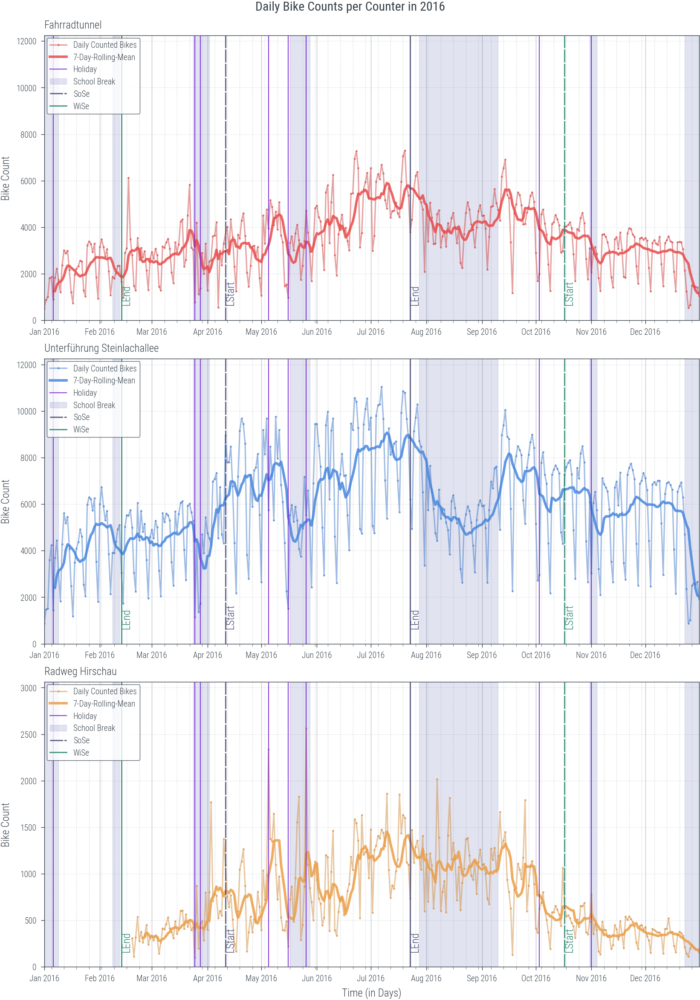

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Allerheiligen

2016-03-22: 5831 counted bikes at Fahrradtunnel.
2016-02-17: 6127 counted bikes at Fahrradtunnel.


In [7]:
STYLE_3_COUNTERS = bundles.beamer_moml(rel_width=2, rel_height=3.8)
create_daily_per_counter_plot(STYLE_3_COUNTERS, 2016, daily_bike_data)
# get date of maximum count in February
df_tunnel_FT_2016 = filter_by_year(daily_bike_data[0], 2016, BikePlotter.COUNTER_ORDER[0])

df_tunnel_mar2016 = df_tunnel_FT_2016[df_tunnel_FT_2016.index.month == 3]
max_day_mar = df_tunnel_mar2016[df_tunnel_mar2016["zählstand"] == df_tunnel_mar2016["zählstand"].max()]
print(f"{max_day_mar.index.date[0]}: {max_day_mar['zählstand'].values[0]} counted bikes at Fahrradtunnel.")

df_tunnel_feb2016 = df_tunnel_FT_2016[df_tunnel_FT_2016.index.month == 2 ]
max_day_feb = df_tunnel_feb2016[df_tunnel_feb2016["zählstand"] == df_tunnel_feb2016["zählstand"].max()]
print(f"{max_day_feb.index.date[0]}: {max_day_feb['zählstand'].values[0]} counted bikes at Fahrradtunnel.")

_As the most observations in the following years are similar to 2014 and 2015, only the differences and specific observations are listed during further analysis._

### 2016: Observations

- Fahrradtunnel has not the steep increase in counts from April to May as in the previous years and as in Steinlachallee this year
- The count at Fahrradtunnel is unusually high on the 17th of February, as well as five weeks later. Something might happend on these days, but no information could be found. The weather was dry but cold (max. 1°C) on 17th of February and sunny and max. 11°C on 17th of March.

__Hirschau is installed!__
- the count at Hirschau is lower than at the other two counters
- a weekly pattern can not be assumed as easily as in the other counters
- in summer months the count and the deviation between days is higher than in winter months
- the impact of school breaks and holidays is not clearly visible in the data

## 2017

2017-04-09: 2028 counted bikes on Sunday at Hirschau.
2017-04-30: 2085 counted bikes on Sunday at Hirschau.
2017-05-25: 2180 counted bikes on Thursday at Hirschau.
2017-06-11: 2335 counted bikes on Sunday at Hirschau.


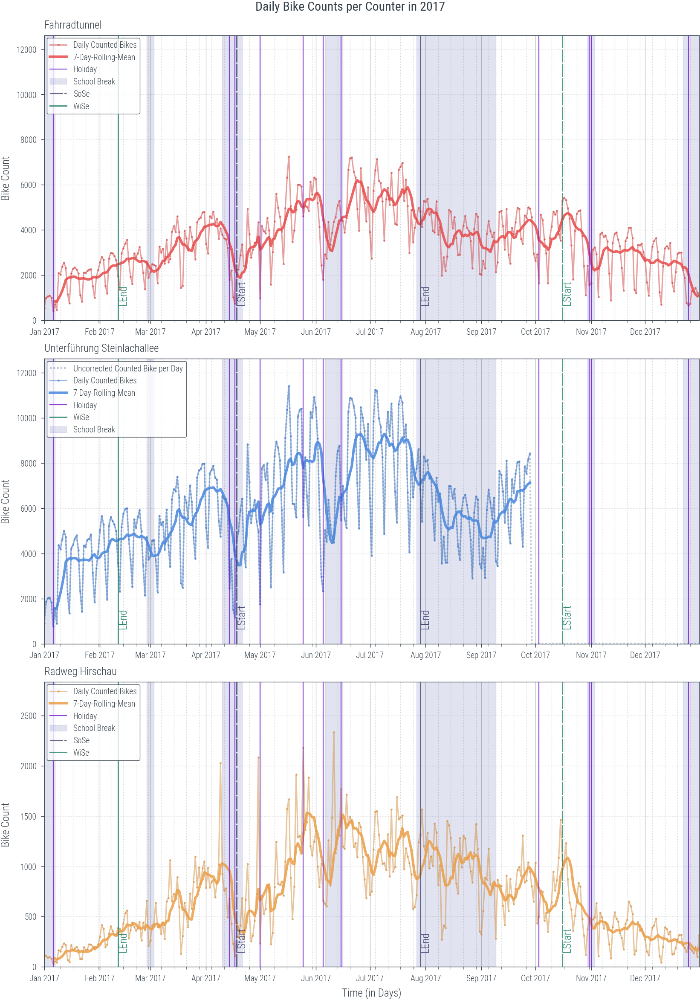

In [8]:
fig, ax = create_daily_per_counter_plot(STYLE_3_COUNTERS, 2017, daily_bike_data, legend_select=["standard", "uncorrected", "standard"], get_figure=True)

# get date of maximum count in February
df_hirschau_summer_2017 = filter_by_year(daily_bike_data[0], 2017, BikePlotter.COUNTER_ORDER[2])
df_hirschau_summer_2017 = df_hirschau_summer_2017[df_hirschau_summer_2017.index.month.isin([4,5,6])]
# extract peak days with >= 2000 counts

df_hirschau_summer_2017_peaks = df_hirschau_summer_2017[df_hirschau_summer_2017["zählstand"] >= 2000]
for index, row in df_hirschau_summer_2017_peaks.iterrows():
    print(f"{index.date()}: {row['zählstand']} counted bikes on {index.day_name()} at Hirschau.")

### 2017: Observations
_If an "uncorrected" (dotted translucent) line appears in the plot, the counter was offline for this time. As the data is still provided with count 0 per hour, this would impact any statistical calculation. Therefor days with counter sum zero are removed from the data!_
- for all counters the count trend increases from January to April much stronger than in the previous years. Maybe the weather was better in the first months of 2017 than in the previous years
- Hirschau data let assume an impact of the easter beak, as the count trend decreases during this time. The two weeks after the trend is still decreasing, as well as for the other counters. Maybe the weather was bad during this time
- Hirschau shows a few extreme peaks, mostly on Sunday. This might be that the bicycle path is used on bike tours
- Steinlachallee counter was offline from October until the start of the next year

## 2018

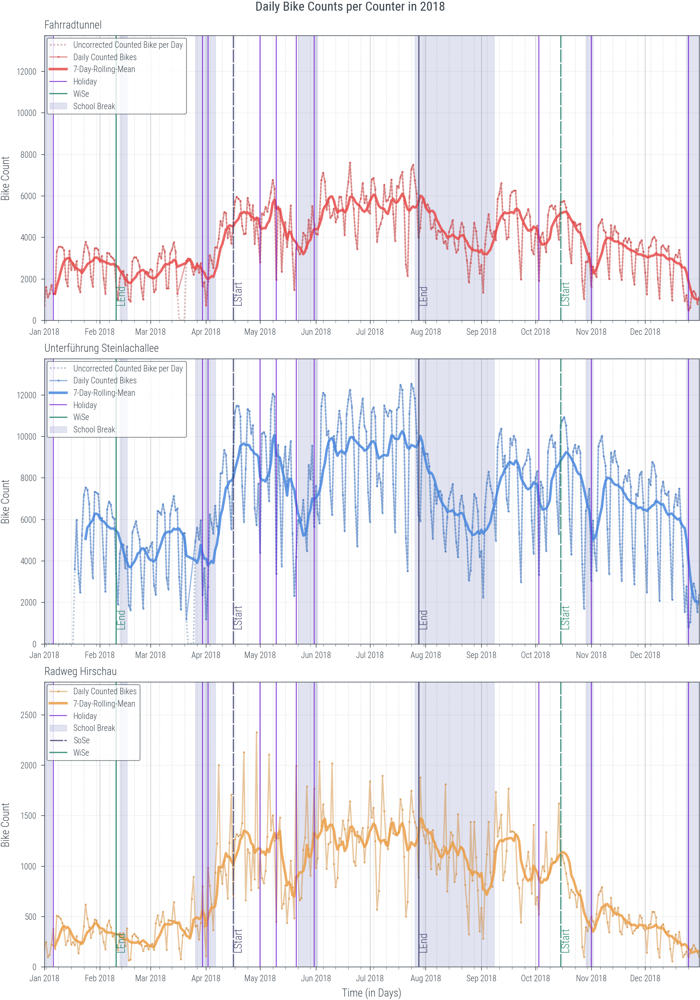

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Allerheiligen, Weihnachten



In [9]:
create_daily_per_counter_plot(STYLE_3_COUNTERS, 2018, daily_bike_data, legend_select=["uncorrected", "uncorrected", "standard"])

### 2018: Observations
- Fahrradtunnel and Steinlachallee had some downtimes this year
- the overall pattern and influences of holidays and school breaks is similar to the previous years
- the trend from January to April appears to decrease slightly. Probably not the best weather in the first months of 2018

## 2019

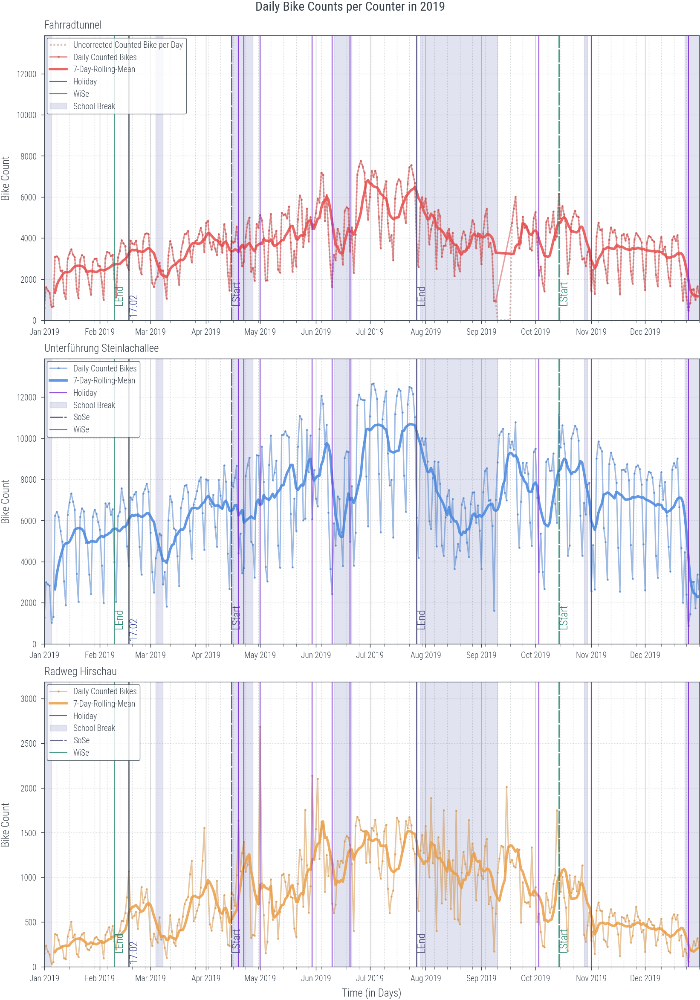

2019-02-17: The maximum count in February at Hirschau was 1066 bikes.


In [10]:
fig, ax = create_daily_per_counter_plot(STYLE_3_COUNTERS, 2019, daily_bike_data, get_figure=True, legend_select=["uncorrected", "standard", "standard"])
df_hirschau_2019 = filter_by_year(daily_bike_data[0], 2019, BikePlotter.COUNTER_ORDER[2])
df_hirschau_feb2019 = df_hirschau_2019[df_hirschau_2019.index.month == 2]
max_date_in_hirschau_feb2019 = df_hirschau_feb2019[df_hirschau_feb2019["zählstand"] == df_hirschau_feb2019["zählstand"].max()]
EventsPlotter.plot_marker(max_date_in_hirschau_feb2019.index, ax)
plt.show()
print(f"{max_date_in_hirschau_feb2019.index.date[0]}: The maximum count in February at Hirschau was {max_date_in_hirschau_feb2019['zählstand'].values[0]} bikes.")

### 2019: Observations
- the trend from January to April is more similar to 2017 again
- Fahrradtunnel doesn't seem to be affected that strong by school breaks as in the previous years
- Hirschau shows no influence of school breaks, but weekly patterns are visible very clearly in winter months
- on February the 17th, a Sunday, the count at Hirschau was very high. At the other counters it is the first Sunday in 2019 the count decreases less than the Sundays before, compared to its previous six days. The weather was sunny and up to 15°C on this day. 

## 2020

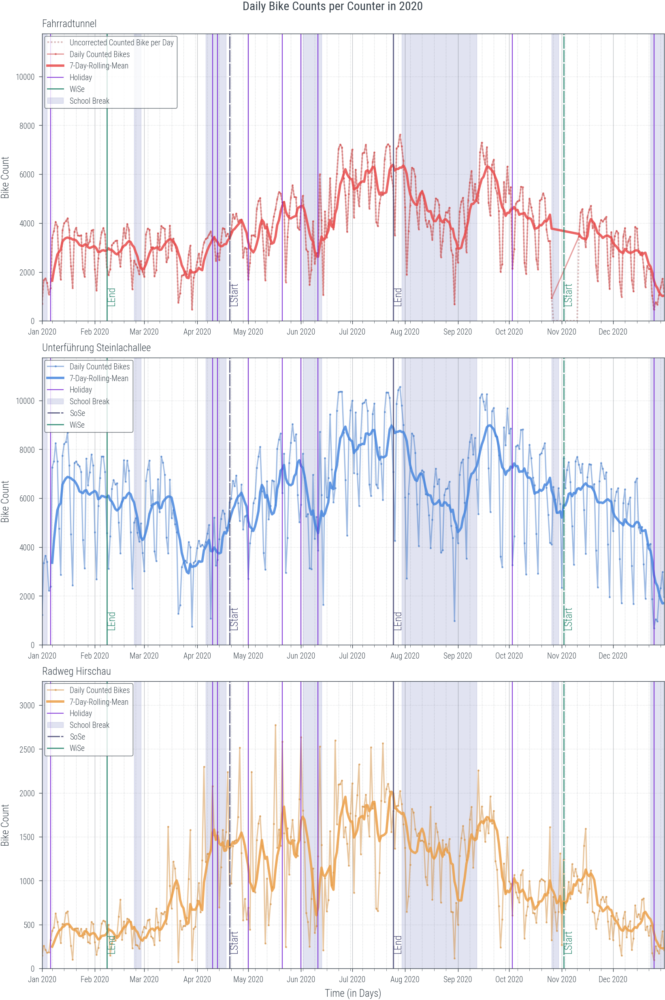

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Weihnachten



In [11]:
STYLE_3C_HIGH = bundles.beamer_moml(rel_width=2, rel_height=4)
create_daily_per_counter_plot(STYLE_3C_HIGH, 2020, daily_bike_data, legend_select=["uncorrected", "standard", "standard"])

### 2020: Observations
- strong start of the year for Fahrradtunnel and Steinlachallee, but there is an abrupt decrease of counts in March. This might be due to the COVID-19 pandemic and the first lockdown in Germany
- Hirschau seems to be less affected by the pandemic, as the count is still increasing in March
- the overall max count in 2020 is lower than in the previous year

#### COVID-19 Pandemic in 2020

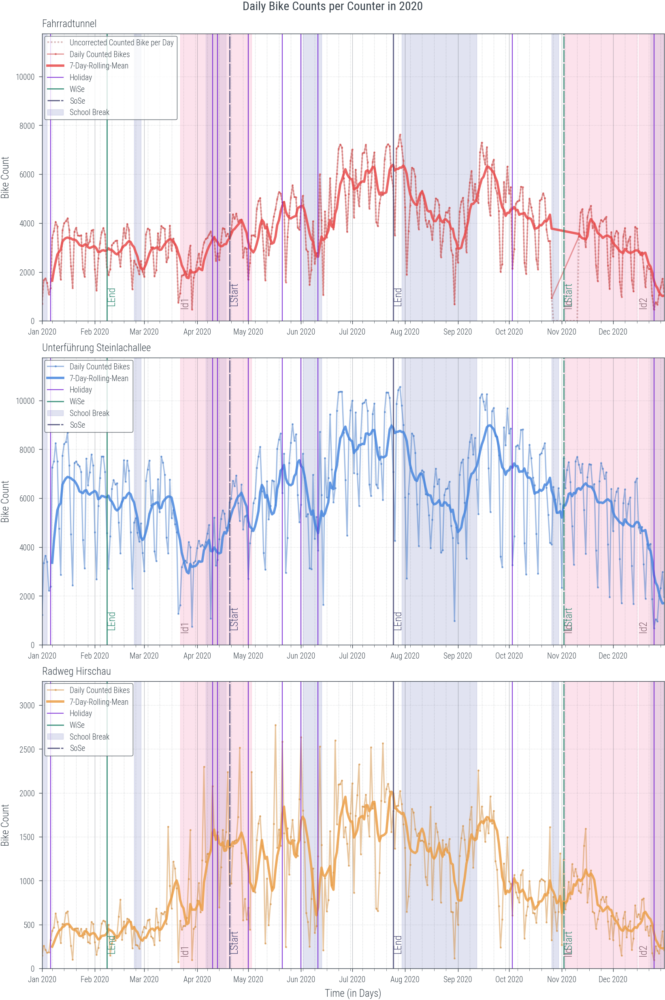

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Weihnachten

Covid-Restrictions:
\ ld1: Einzelhandel offen für lebenswichtige Bereiche, Sonntagskaufverbote ausgesetzt. Öffnung mit Hygieneauflagen. Schließungen im Publikumsverkehr: Bars, Clubs, Theater, Kinos, Sportanlagen, Spielplätze. Weitere Verbote: Zusammenkünfte in Vereinen, Bildungseinrichtungen, Kirchen. Länderregelungen für Besuchsregelungen in Einrichtungen, Beschränkungen für Risikogebietsbesucher. Auflagen für Mensen, Restaurants, Hotels. Übernachtungen nur notwendig, keine Touristen. Restaurants von 6-18 Uhr geöffnet. Ansammlungen von mehr als zwei Personen sind untersagt. In der Öffentlichkeit gilt ein Mindestabstand von 1,5 Metern. Draußen darf man nur alleine, mit einer weiteren nicht im Haushalt lebenden Person oder mit Angehörigen des eigenen Hausstands unterwegs sein. Restaurants, Einzelhandel, Freizeit- und

In [12]:
# 2020 beginning of COVID-19
create_daily_per_counter_plot(STYLE_3C_HIGH, 2020, daily_bike_data, legend_select=["covid_uncorrected", "covid_standard", "covid_standard"], show_covid=True)

## 2021

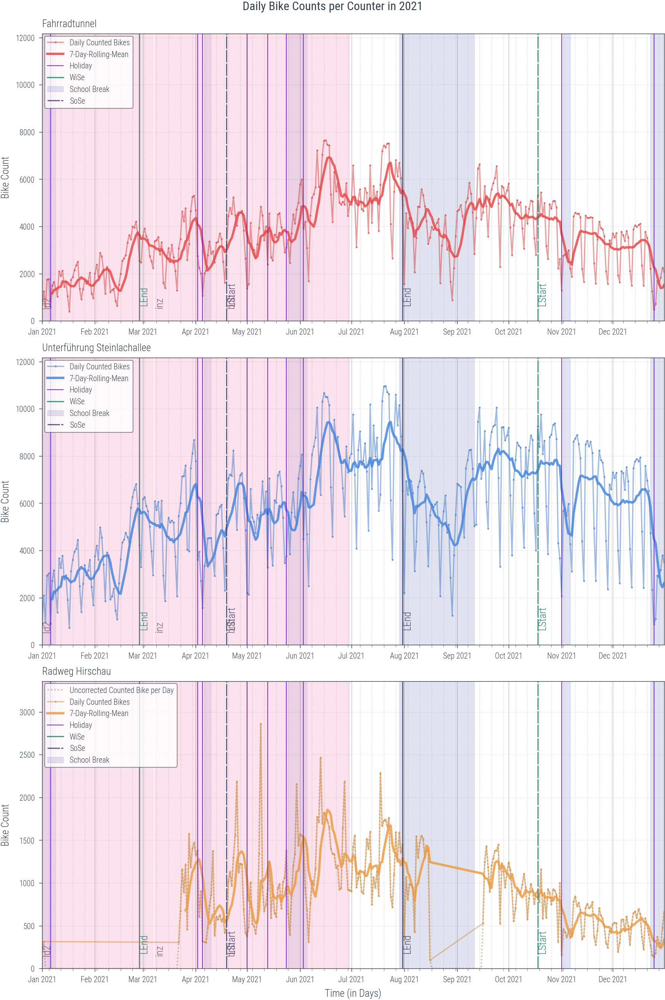

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Allerheiligen, Weihnachten

Covid-Restrictions:
\ ld2: Bundesweiter Lockdown: Strengere Regelungen - Gottesdienste mit Abstand und Maskenpflicht (ohne Gesang). Silvester: Ausgangsbeschränkungen, Pyrotechnikverkaufsverbot. Geschlossene Dienstleistungen (außer medizinische Behandlungen). Schulen schließen, Online-Unterricht für Abschlussklassen. Einzelhandel schließt, Ausnahmen für lebensnotwendige Bereiche. Weihnachtsausnahmen: Treffen mit vier Personen im Familienkreis, bei Freunden auf zwei Haushalte begrenzt. Home-Office empfohlen, Reisen werden abgeraten.

\ inz: Stufenplan für Lockerungen (z. B. bei den Kontaktbeschränkungen und körpernahen Dienstleistungen sowie Öffnung von Geschäften, Museen, Galerien und botanischen Gärten) mit integrierter inzidenzabhängiger Notbremse.

\ bnb: Bundesnotbremse tritt in Kraft (bei Inzidenz über 100), Schul- und Kita

In [13]:
create_daily_per_counter_plot(STYLE_3C_HIGH, 2021, daily_bike_data, legend_select=["covid_standard", "covid_standard", "covid_uncorrected"], show_covid=True)

### 2021: Observations
- Hirschau is offline about a third of the year
- the count trend seem to recover compared to last year, but the max counts are still lower than in the years before 2020
- in middle of February a steep increase of counts can be observed at Fahrradtunnel and Steinlachallee. The weather was sunny, dry and up to 15°C in the last third of February. This might be the reason for the increase of counts.

## 2022

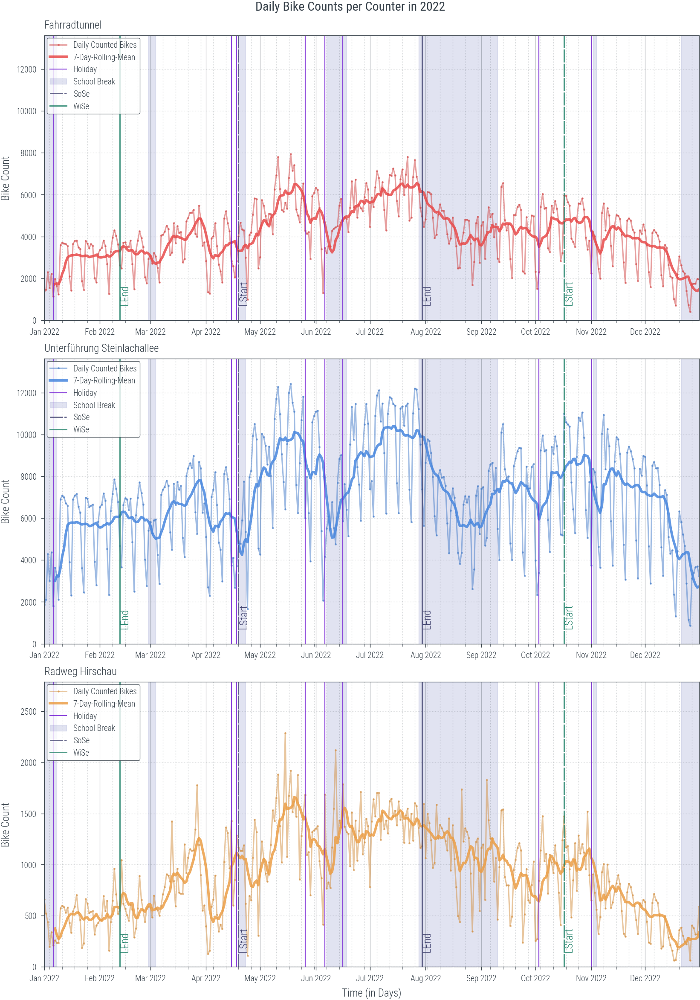

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Allerheiligen

2022-06-05: 1300 counted bikes at Fahrradtunnel.
2022-06-05: 412 counted bikes at Radweg Hirschau.
2022-06-05: 2077 counted bikes at Unterführung Steinlachallee.


In [14]:
create_daily_per_counter_plot(STYLE_3_COUNTERS, 2022, daily_bike_data, legend_select=["standard", "standard", "standard"])

df_jun2022 = filter_by_year(daily_bike_data[0], 2022)
df_jun2022 = df_jun2022[df_jun2022.index.month == 6]
for id in df_jun2022["counter_site_id"].unique():
    df_jun2022_counter = df_jun2022[df_jun2022["counter_site_id"] == id]
    df_min = df_jun2022_counter[df_jun2022_counter["zählstand"] == df_jun2022_counter["zählstand"].min()]
    print(f"{df_min.index.date[0]}: {df_min['zählstand'].values[0]} counted bikes at {BikePlotter.COUNTER[df_min['counter_site_id'].values[0]]['name']}.")

### 2022: Observations
- the counts and trends show the behavior of the pre-covid years
- it appears to be more cyclists in winter months than in the previous years
- on June the 5th something leads many people to not use a bike on this day. As it was a Sunday, whitsun, and the start of school break, it might be that many people were on vacation.

## 2023

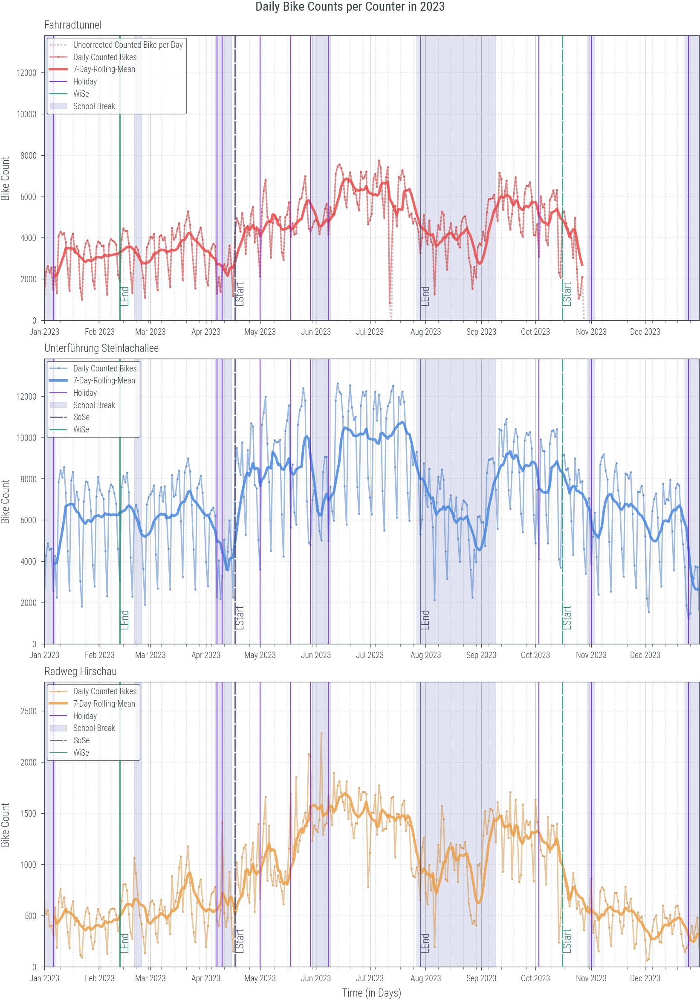

Depicted holidays:
\ Heilige drei Könige, Karfreitag, Ostermontag, Tag der Arbeit, Christi Himmelfahrt, Pfingstmontag, Fronleichnam, Tag der Deutschen Einheit, Allerheiligen, Weihnachten



In [15]:
create_daily_per_counter_plot(STYLE_3_COUNTERS, 2023, daily_bike_data, legend_select=["uncorrected", "standard", "standard"])

### 2023: Observations
- the counts and trends show the behavior of the pre-covid years, but the total count is higher, especially in the winter months. 
- the Fahrradtunnel counter is offline from end of October to the end of the year
- Hirschau shows an impact of summer school break

## Impact of Holidays

From our visual analysis we assume holidays to be days with lower bike counts than usual at counters Fahrradtunnel and Steinlachallee. To verify this assumption, we calculate the mean count per weekday that is not a holiday and compare it to the mean count of the holidays on that weekday. We do this for each counter separately.

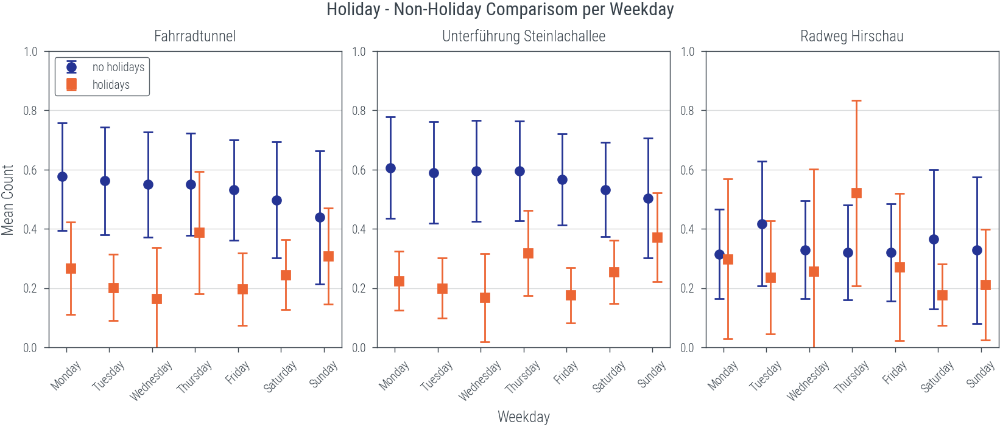

In [16]:
plt.rcParams.update(bundles.beamer_moml(rel_width=2, rel_height=1.15))

df_holiday = ed.data["holiday"]
df_holiday = df_holiday[(df_holiday["class"].isin([1, 4])) | (df_holiday["abbreviation"].isin(["SLV", "HAB"]))][['holiday', "start"]]
weekday_mapping = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Fahrradtunnel
df_tunnel = bd.get_daily_data(counter_id=[100003358])
# Steinlachallee
df_steinlachallee = bd.get_daily_data(counter_id=[100003359])
# Hirschau
df_hirschau = bd.get_daily_data(counter_id=[100026408])

df_collection = [df_tunnel, df_steinlachallee, df_hirschau]
counter_names = ["Fahrradtunnel", "Unterführung Steinlachallee", "Radweg Hirschau"]

fig, ax = plt.subplots(1, 3)
for i, data in enumerate(df_collection):
    for d in range(7):
        daily_data = data[data["weekday"] == d].copy()
        daily_data["zählstand"] /= daily_data["zählstand"].max()
        holiday = daily_data[daily_data["iso_timestamp"].dt.date.isin(df_holiday["start"].dt.date)].copy()
        no_holiday = daily_data[~daily_data["iso_timestamp"].dt.date.isin(df_holiday["start"].dt.date)].copy()
        
        ax[i].errorbar(
            x=d-0.1,
            y=no_holiday["zählstand"].mean(),
            yerr=no_holiday["zählstand"].std(),
            ms=5,
            capsize=3,
            fmt="o",
            color=ct.PRIMARY_COLORS[0],
            label="no holidays" if d == 0 else "_nolabel_"
        )
        ax[i].errorbar(
            x=d+0.1,
            y=holiday["zählstand"].mean(),
            yerr=holiday["zählstand"].std(),
            ms=5,
            capsize=3,
            fmt="s",
            color=ct.PRIMARY_COLORS[1],
            label="holidays" if d == 0 else "_nolabel_"
        )
    ax[i].set_xticks(range(7))
    ax[i].set_xticklabels(weekday_mapping, rotation=45)
    ax[i].set_ylim(bottom=0)
    ax[i].set_title(counter_names[i],loc="center")
    ax[i].grid(axis="y")
    ax[i].set_ylim(0, 1)
ax[0].set_ylabel("Mean Count")
ax[1].set_xlabel("Weekday")
plt.suptitle("Holiday - Non-Holiday Comparisom per Weekday")
ax[0].legend(loc="upper left", ncols=1)
plt.show()

We can see, that on holidays the mean count is mostly lower than on normal weekdays for each counter. The only outlier is Thursday, which is most likely connected to the holidays Fronleichnam and Christi Himmelfahrt, which are both in summer and there is a tradition in southern Germany for the latter-day, that people go on bike tours.

## Overall Observations and Conclusions

- over the years the trend pattern of Fahrradtunnel and Steinlachallee appear very similar
- Steinlachaallee has a higher count per year than Fahrradtunnel
- Fahradtunnel has a significant higher count than Hirschau
- but the total number of cyclists seem to increase over the years. This must be verified in a further analysis
- the count trend of Hirschau is different to the other counters, a seasonal trend is visible, as in summer likely more people go on bike tours than in winter
- it seems to be a weekly pattern in the data, as the count is lower on Sundays than on the other days of the week. This must be confirmed in a further analysis
- the trend is strongly affected by school breaks, but an influence of lecture period start (violet lines) is not visible as clearly. This leads to the assumption, that most people using bikes are pupil and working people. Students might have not as much impact on the count trend. An explanation might be that a lot of students are living in the city center and WHO. Therefor they do not pass a counter station, as they are located in the south and west of the city. Furthermore, students might use other means of transport, like bus or car, to get to the university, especially those living in other towns around Tübingen 
- on holidays the count is lower than on normal weekdays
- in 2020 the effect of Covid is clearly visible at the counter stations Fahrradtunnel and Steinlachallee. The count trend decreases abruptly in March, when the first lockdown was introduced in Germany, as well as in the time of the second lockdown in December. In 2021 the count trend recovers, but the total count is still lower than in the years before 2020. In 2022 the count trend is similar to the years before 2020, but the total count is higher, especially in the winter months

__Further Questions__:
- is there a total trend of increasing cyclists in Tübingen over the years?
- is there a weekly pattern in the data and how does it look like?
- how does the Hirschau counter differ from the other counters?
- is there a difference in workdays and weekends? Might an hourly analysis give more insights?
- are there other effects that influence the decision to use a bike or not? (e.g. weather, temperature, precipitation, black ice, fuel prices, home-office ...)